# Advanced Lane Finding

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Import Everything

In [322]:
# Import everything
import os
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Look at the images

camera_cal/calibration1.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration2.jpg
camera_cal/calibration20.jpg
camera_cal/calibration3.jpg
camera_cal/calibration4.jpg
camera_cal/calibration5.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg


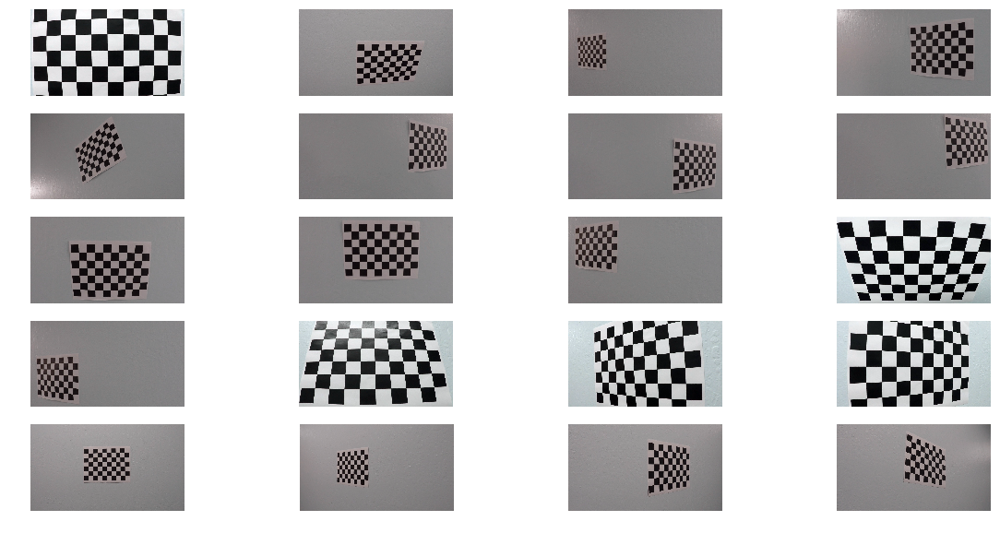

In [323]:
import matplotlib.gridspec as gridspec

images = glob.glob('camera_cal/calibration*.jpg')

plt.figure(figsize=(20, 10))

for idx, fname in enumerate(images):
    print(fname)
    img = cv2.imread(fname)

    plt.subplot(len(images)//4, 4, idx+1)
    plt.imshow(img)
    plt.axis("off")

# Calibrate the Camera

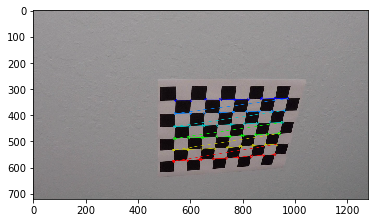

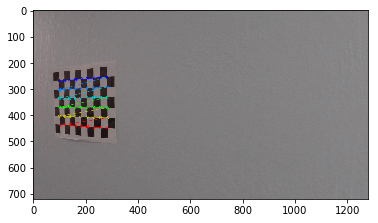

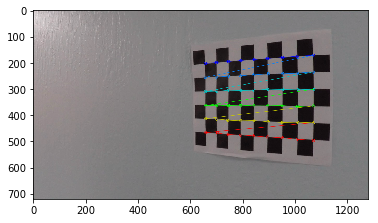

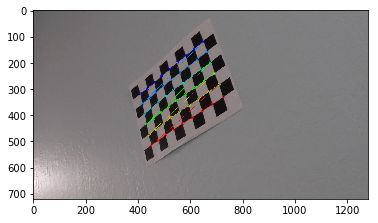

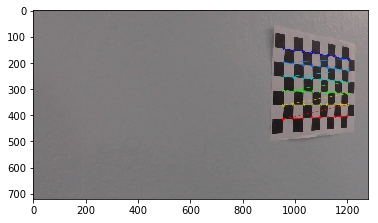

...

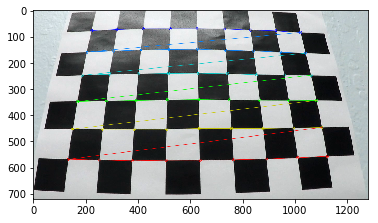

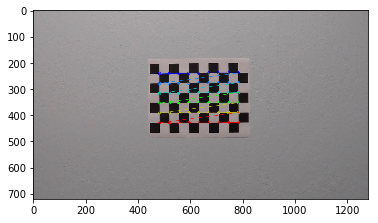

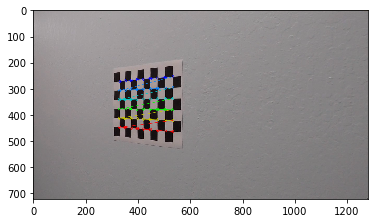

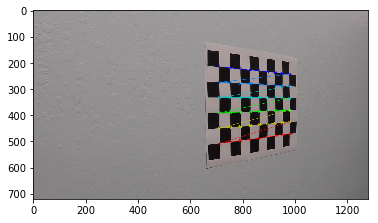

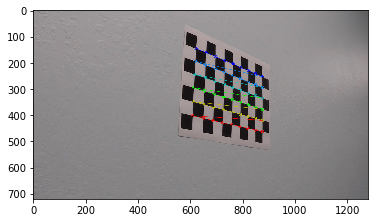

In [403]:
def find_chessboard_corners(image_file_pattern, num_x_points, num_y_points):
    """
    Load chessboard image files and compute mappings
    between image points and object points.
    Args:
        image_file_pattern (str): File name pattern of chessboard images.
        num_x_points (int): The number of corners in x-coordinate of a chessboard image.
        num_y_points (int): The number of corners in y-coordinate of a chessboard image.
    Returns:
        mtx (numpy ndarray): Camera matrix.
        dist (numpy ndarray): Distortion coefficients.
    """
    objpoints = []
    imgpoints = []
    image_files = glob.glob(image_file_pattern)
    if len(image_files) == 0:
        raise FileNotFoundError('No image files: {}'.format(image_file_pattern))
        
    # prepare object points
    objp = np.zeros((num_x_points * num_y_points, 3), np.float32)
    objp[:,:2] = np.mgrid[0:num_x_points, 0:num_y_points].T.reshape(-1,2)  # x,y coordinate
    # find chessborad corners for each image
    for image_file in image_files:
        img = cv2.imread(image_file)
        img_size = (img.shape[1], img.shape[0])


        # find chessboard corners
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, (num_x_points,num_y_points), None)
        
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            
            img_corners = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        
            plt.imshow(img)
            plt.show()
        
            ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist, objpoints, imgpoints

# generate mapping between object points and image points
mtx, dist, objpoints, imgpoints = find_chessboard_corners('./camera_cal/calibration*.jpg', 9, 6)

# Undistort the Image

In [325]:
def undistort_image(img, objp, imgp):
    '''
    Undistort and image based on the provided camera calibration factors.
    
    :param img:
        Image (RGB)
        
    :param objp:
        Object points calibration factors
        
    :param imgp:
        Image points calibration factors
        
    :return:
        Undistorted image
    '''
    
    img_size = (img.shape[1], img.shape[0])
    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objp, imgp, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

# Testing the undistortion

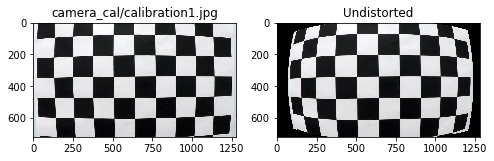

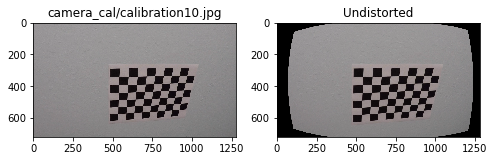

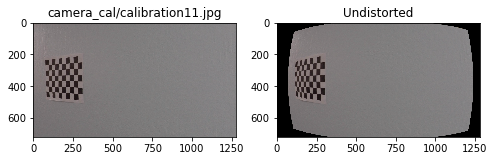

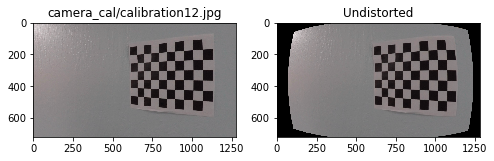

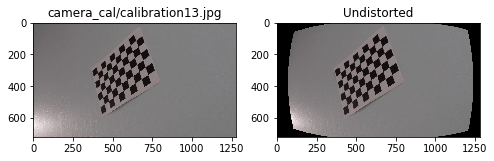

...

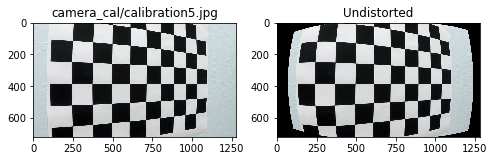

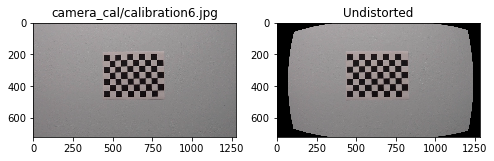

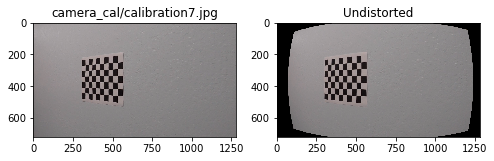

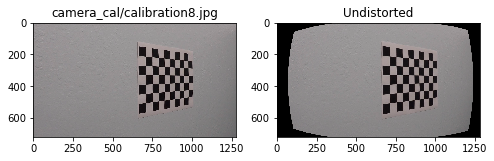

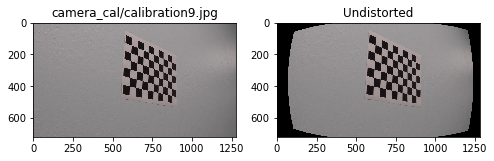

In [326]:
for fname in images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(img)
    ax1.set_title(fname)
    ax2.imshow(undistort_image(img, objpoints, imgpoints))
    ax2.set_title('Undistorted')

# Working with the Test Images i.e. Lane Image data now

## Undistort the Test Images

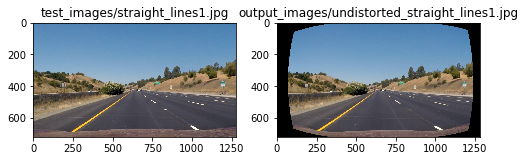

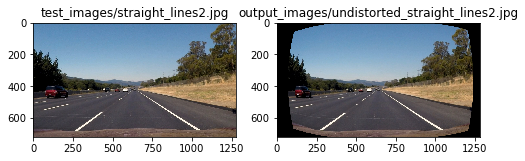

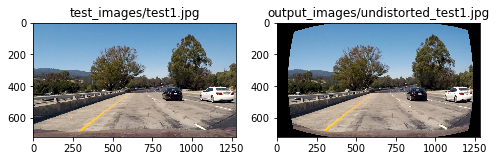

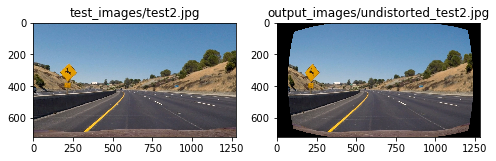

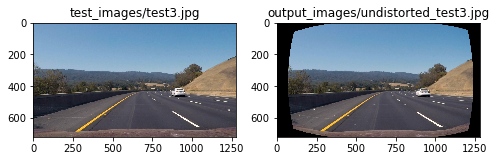

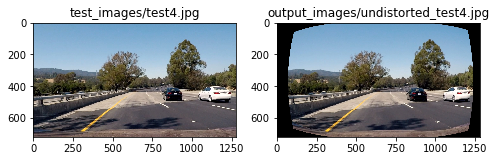

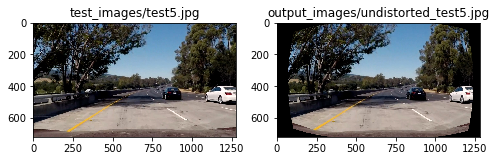

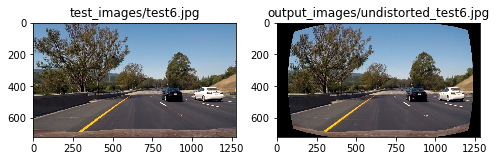

In [327]:
test_images = glob.glob('test_images/*.jpg')
output_folder = 'output_images'

for fname in test_images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(fname)
    
    out_fname = os.path.join(output_folder, "undistorted_%s"%os.path.basename(fname))
    undistorted=undistort_image(img, objpoints, imgpoints)
    ax2.imshow( cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title(out_fname)
    
    cv2.imwrite(out_fname, undistorted)

# Warp the Image - Perspective Transform

In [328]:
def warp_image(img, src, dst, image_size):
    """
    Apply perspective transformation on the provided image to gain a birds-eye-view,
    based on the source and destination image points.
    
    :param img:
        Image to transform
        
    :param: src:
        Source coordinates
        
    :param dst:
        Destination coordinates
        
    :param image_size:
        Image shape as (width, height)
        
    :returns:
        Tuple of the warped image, the transform matrix and inverse transform matrix
    """
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, image_size, flags=cv2.INTER_LINEAR)


    return warped, M, Minv

def unwarp_image(img, src, dst, img_size):
    M = cv2.getPerspectiveTransform(src, dst)
    unwarped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return unwarped

In [329]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        Minv = cv2.getPerspectiveTransform(dst, src)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M, Minv

### Checked Warped Image

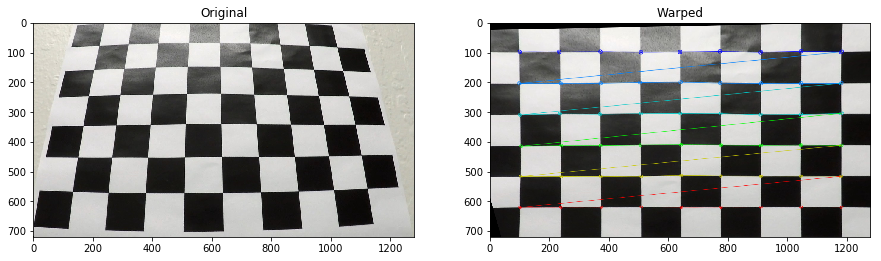

In [330]:
# Check warped image
img = mpimg.imread('./camera_cal/calibration3.jpg')
warped, M, Minv = corners_unwarp(img, 9, 6, mtx, dist)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.imshow(img)
ax1.set_title('Original')
ax2.imshow(warped)
ax2.set_title('Warped')

(-0.5, 1279.5, 719.5, -0.5)

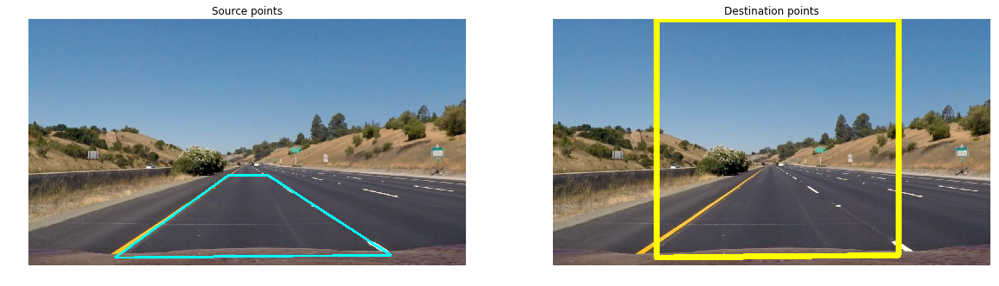

In [331]:
def get_src_dest_warp_points(image):
    """
    Computer the Source and Destination perspective transformation points.
    These points are fine-tuned to select the area within the lane lines on
    a straight/flat road such that the end result shows approximately
    parallel lines. Testing shows that these value are good for the sample
    curved sections of road as well.
    
    :param image:
        REFACTOR - not required anymore - pass in an IMAGE SHAPE instead if necessary!
    
    :return:
        Source and Destination image points to be used for a perspective transformation.
    """
    
    # Construct source and destination points as the basis for the perspective transform
    center_point = np.uint(image.shape[1]/2)
    y_top = np.uint(image.shape[0]/1.5)
    
    x_top_left = center_point - .25*np.uint(image.shape[1]/2) + 50
    x_top_right = center_point + .25*np.uint(image.shape[1]/2) - 50
    x_bottom_left = center_point - 1*np.uint(image.shape[1]/2) + 150
    y_bottom_left = np.uint(image.shape[0])
    x_bottom_right = np.uint(image.shape[1]) - 150
    
    # trapezoid following road lines
    
    corners = np.float32([[253, 697], [585, 456], [700, 456], [1061, 690]])
    new_top_left = np.array([corners[0, 0], 0])
    new_top_right = np.array([corners[3, 0], 0])
    offset = [50, 0]
    
    img_size = (image.shape[1], image.shape[0])
    
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    dst = np.float32([corners[0] + offset, new_top_left + offset, new_top_right - offset, corners[3] - offset])
    
    # rectangle around entire image
    
    return src, dst


image = cv2.imread("test_images/straight_lines1.jpg")
src, dst = get_src_dest_warp_points(image)

# Plot the chosen source and destination points on the original image
points_image_src = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
points_image_dst = points_image_src.copy()


src_pts = src.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_src, [src_pts], True, (0, 255, 255), thickness=5)

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.imshow(points_image_src)
plt.title("Source points")
plt.axis("off")

dst_pts = dst.reshape((-1, 1, 2)).astype("int32")
cv2.polylines(points_image_dst, [dst_pts], True, (255, 255, 0), thickness=15)

plt.subplot(1, 2, 2)
plt.imshow(points_image_dst)
plt.title("Destination points")
plt.axis("off")

# Thresholding - Color and Gradient

## Sobel Filter

In [332]:
class SobelThresholder:
    '''
    Class to group the static methods transforming the images to binary format after thresholding
    '''
    
    @staticmethod
    def abs_sobel_thresh(img, sobel_kernel=3, thresh=[0, 255], orient='x'):
        '''
        Calculate directional gradient
        '''
        # Apply the following steps to img
        # 1) Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # 2) Take the derivative in x or y given orient = 'x' or 'y'
        if orient == 'x':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        elif orient == 'y':
            sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        else:
            raise ValueError('orient must be "x" or "y".')
        # 3) Take the absolute value of the derivative or gradient
        abs_sobel = np.absolute(sobel)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        # 5) Create a mask of 1's where the scaled gradient magnitude
        # is > thresh_min and < thresh_max
        binary_output = np.zeros_like(scaled_sobel)
        binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        # 6) Return this mask as binary_output image
        return binary_output
    
    @staticmethod 
    def mag_thresh(img, sobel_kernel=3, thresh=(30, 255)):
        '''
        Calculate gradient magnitude
        '''
        # 1) Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # 2) Take the gradient in x and y separately
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # 3) Calculate the magnitude 
        gradmag = np.sqrt(sobelx**2 + sobely**2)
        # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
        scaled_gradmag = np.uint8(255*gradmag/np.max(gradmag))
        # 6) Create a binary mask where mag thresholds are met
        sxbinary = np.zeros_like(scaled_gradmag)
        sxbinary[(scaled_gradmag >= thresh[0]) & (scaled_gradmag <= thresh[1])] = 1

        # 7) Return this mask as your binary_output image
        binary_output = np.copy(scaled_gradmag) # Remove this line
        return binary_output
    
    @staticmethod 
    def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
        '''
        Calculate gradient direction
        '''
        # Apply the following steps to img
        # 1) Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # 2) Take the gradient in x and y separately
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # 3) Take the absolute value of the x and y gradients
        abs_sobelx = np.absolute(sobelx)
        abs_sobely = np.absolute(sobely)
        # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
        gradient = np.arctan2(abs_sobely, abs_sobelx)
        # 5) Create a binary mask where direction thresholds are met
        sbinary = np.zeros_like(gradient)
        sbinary[(gradient >= thresh[0]) & (gradient <= thresh[1])] = 1
        # 6) Return this mask as your binary_output image
        return sbinary
    
    @staticmethod
    def gaussian_blur(img, kernel_size):
        """Applies a Gaussian Noise kernel"""
        return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

    @staticmethod 
    def combined_single_channel_threshold(image, ksize=15, thresh=(20, 100), mag_thresh=(30, 100), dir_thresh=(0.7, 1.3)):
        '''
        param ksize integer denoting Sobel kernel size
        Choose a larger odd number to smooth gradient measurements
        '''
        blurred = SobelThresholder.gaussian_blur(img, ksize)
        gradx = SobelThresholder.abs_sobel_thresh(blurred, orient='x', sobel_kernel=ksize, thresh=thresh)
        grady = SobelThresholder.abs_sobel_thresh(blurred, orient='y', sobel_kernel=ksize, thresh=thresh)
        mag_binary = SobelThresholder.mag_thresh(blurred, sobel_kernel=ksize, thresh=mag_thresh)
        dir_binary = SobelThresholder.dir_threshold(blurred, sobel_kernel=ksize, thresh=dir_thresh)
        # combine filters
        combined = np.zeros_like(dir_binary)
        combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        return combined

### Applying the Sobel Filter

15


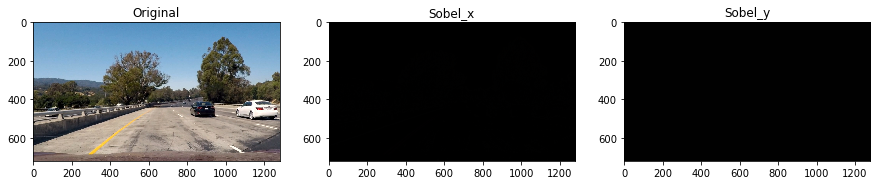

In [333]:
# Sample image
img = cv2.imread('./test_images/test1.jpg')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))
ax1.set_title('Original')
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
# sobel x
sobel_x_binary = SobelThresholder.abs_sobel_thresh(img, orient='x', sobel_kernel=15, thresh=(15, 100))
ax2.set_title('Sobel_x')
ax2.imshow(sobel_x_binary, cmap='gray')
# sobel y
sobel_y_binary = SobelThresholder.abs_sobel_thresh(img, sobel_kernel=15, thresh=(0, 255), orient='y')
ax3.set_title('Sobel_y')
ax3.imshow(sobel_y_binary, cmap='gray')

### Magnitude of the Gradient

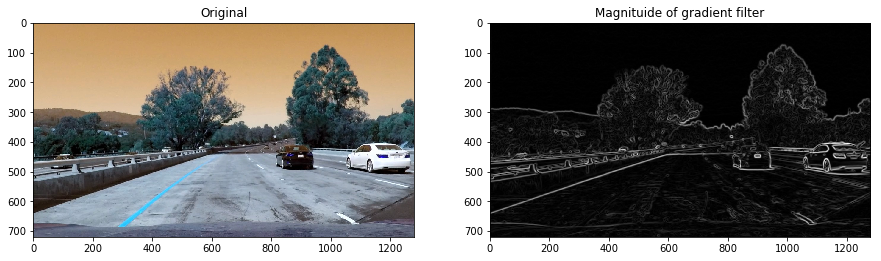

In [334]:
# Sample image
img = cv2.imread('./test_images/test1.jpg')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.set_title('Original')
ax1.imshow(img)
# magnitude of gradient filter
mag_binary = SobelThresholder.mag_thresh(img, sobel_kernel=15, thresh=(15, 100))
ax2.set_title('Magnituide of gradient filter')
ax2.imshow(mag_binary, cmap='gray')

### Direction of the Gradient


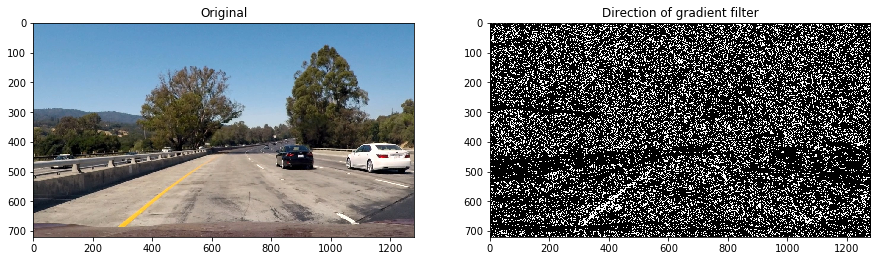

In [335]:
# Sample image
img = mpimg.imread('./test_images/test1.jpg')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.set_title('Original')
ax1.imshow(img)
# direction of gradient filter
dir_mask = SobelThresholder.dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.1))
ax2.set_title('Direction of gradient filter')
ax2.imshow(dir_mask, cmap='gray')

### Combine gradient filters

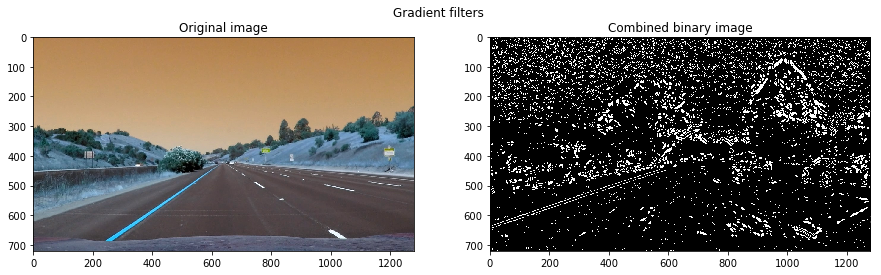

In [336]:
img = mpimg.imread('./test_images/test1.jpg')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
fig.suptitle('Gradient filters')
ax1.imshow(image)
ax1.set_title('Original image')
combined = SobelThresholder.combined_single_channel_threshold(img, ksize=15)
ax2.set_title('Combined binary image')
ax2.imshow(combined, cmap='gray')

## Color Spaces

### HLS Color Space

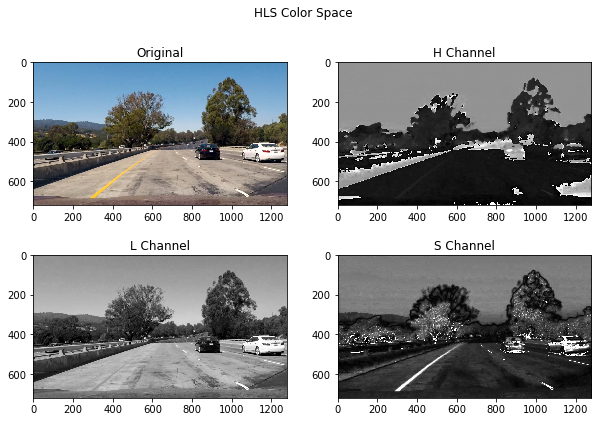

In [337]:
img = mpimg.imread('./test_images/test1.jpg')
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
h_channel = hls[:,:,0]
l_channel = hls[:,:,1]
s_channel = hls[:,:,2]
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 6.5))
fig.suptitle('HLS Color Space')
ax1.set_title('Original')
ax1.imshow(img)
ax2.set_title('H Channel')
ax2.imshow(h_channel, cmap='gray')
ax3.set_title('L Channel')
ax3.imshow(l_channel, cmap='gray')
ax4.set_title('S Channel')
ax4.imshow(s_channel, cmap='gray')

### HSV color space

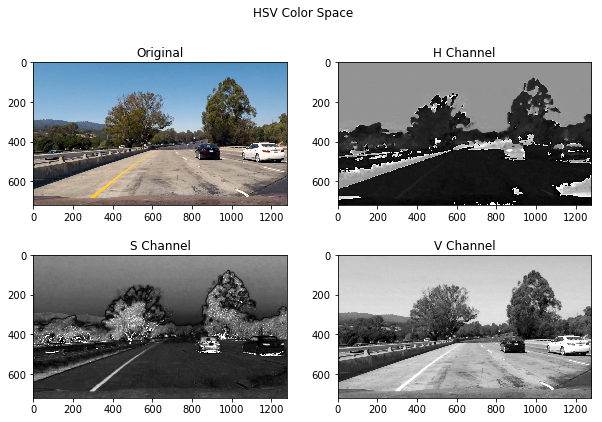

In [338]:
img = mpimg.imread('./test_images/test1.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
h_channel = hsv[:,:,0]
s_channel = hsv[:,:,1]
v_channel = hsv[:,:,2]
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 6.5))
fig.suptitle('HSV Color Space')
ax1.set_title('Original')
ax1.imshow(img)
ax2.set_title('H Channel')
ax2.imshow(h_channel, cmap='gray')
ax3.set_title('S Channel')
ax3.imshow(s_channel, cmap='gray')
ax4.set_title('V Channel')
ax4.imshow(v_channel, cmap='gray')

### Applying Color Threshold

In [364]:
class ColorThresholder:
    @staticmethod
    def hls_threshold(img, thresh=(0, 255), channel=2):
        '''
        Channel 2 means we are selecting s
        '''
        # 1) Convert to HLS color space
        S = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,channel]
        # 2) Apply a threshold to the S channel
        binary_output = S.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output
    @staticmethod
    def red_select(img, thresh=(0, 255)):
        # 1) Convert to HLS color space
        R = img[:,:,2]
        # 2) Apply a threshold to the S channel
        binary_output = R.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output
    @staticmethod
    def yCrCb_select(img, thresh=(0, 255), channel=0):
        # 1) Convert to HLS color space
        S = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)[:,:,channel]
        # 2) Apply a threshold to the S channel
        binary_output = S.copy()
        binary_output[(S < thresh[0]) | (S > thresh[1])] = 0
        # 3) Return a binary image of threshold result
        return binary_output

### Final Thresholder

In [368]:
class FinalThresholder:
    @staticmethod
    def grad_color_threshold(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
        """
        Applies varies transformation on an image and combines them in one binary output
        Parameters
        ----------
        image : numpy array
            The image to process
        Returns
        -------
        image : numpy array
            The binary output image
        """
        img = np.copy(img)
        # Convert to HLS color space and separate the V channel
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
        l_channel = hls[:,:,1]
        s_channel = hls[:,:,2]
        # Apply sobel x to L channel
        sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
        abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

        # Threshold x gradient
        sxbinary = np.zeros_like(scaled_sobel)
        sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

        # Threshold color channel
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

        # Stack each channel
        # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
        # be beneficial to replace this channel with something else.
        color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
        return color_binary
    @staticmethod
    def get_thresholded(img):
        filters = FinalThresholder.grad_color_threshold(img)
        combined_binary = np.zeros_like(filters)
        combined_binary[(filters[:,:,1] == 1) | (filters[:,:,2] == 1)] = 1
        return combined_binary

### Example of Color Thresholder

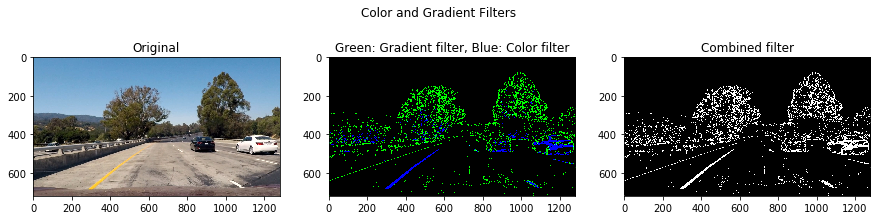

In [369]:
# Show example
img = mpimg.imread('./test_images/test1.jpg')
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3.5))
fig.suptitle('Color and Gradient Filters')
ax1.set_title('Original')
ax1.imshow(img)
filters = FinalThresholder.grad_color_threshold(img)
ax2.set_title('Green: Gradient filter, Blue: Color filter')
ax2.imshow(filters)
combined_binary = FinalThresholder.get_thresholded(img)
combined_binary[(filters[:,:,1] == 1) | (filters[:,:,2] == 1)] = 1
ax3.set_title('Combined filter')
ax3.imshow(combined_binary, cmap='gray')
plt.savefig('./output_images/combined_filters.png', bbox_inches='tight')

### Checking the threshold

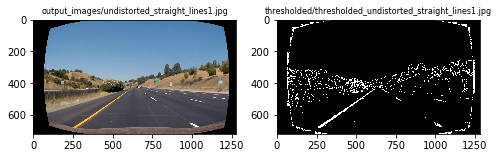

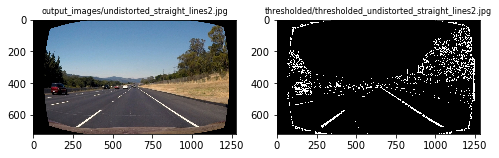

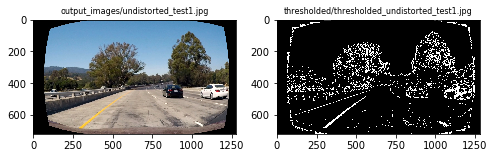

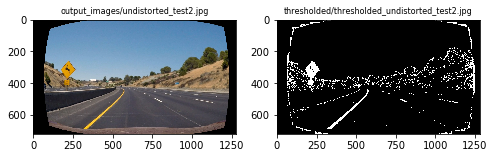

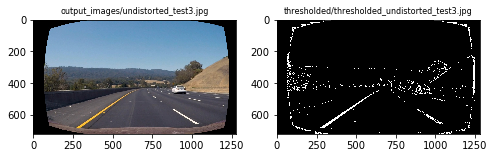

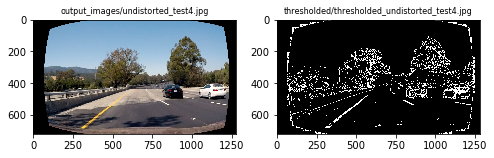

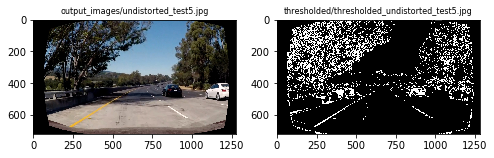

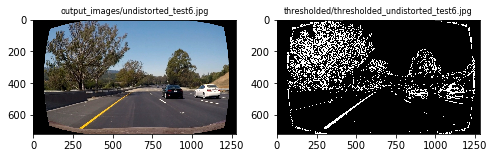

In [370]:
test_images = glob.glob('output_images/undistorted_*.jpg')
output_folder = 'thresholded'

for fname in test_images:
    img = cv2.imread(fname)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(fname, fontsize=8)
    
    out_fname = os.path.join(output_folder, "thresholded_%s"%os.path.basename(fname))
    thresholded = FinalThresholder.get_thresholded(img)
    ax2.imshow( thresholded, cmap='gray')
    ax2.set_title(out_fname, fontsize=8)
    
    cv2.imwrite(out_fname, thresholded)

## Back to Perspective Transfomation - Finding Corners

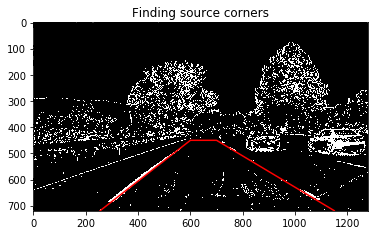

In [371]:
# Show example
img = mpimg.imread('./test_images/test1.jpg')
combined_binary = FinalThresholder.get_thresholded(img)
plt.imshow(combined_binary, cmap='gray')
plotted = plt.plot([255, 600, 700, 1150], [719, 450, 450, 719], 'r-')
plt.title('Finding source corners')
plt.savefig('./output_images/src_corners.png', bbox_inches='tight')

In [385]:
# perspective transformation
class PerspectiveTransformer:
    @staticmethod
    def transform(img, src_corners):
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        offset_x = 300 # offset for dst points
        offset_y = 0
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])
        # For source points I'm grabbing the outer four detected corners
        src = np.float32(src_corners)
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result
        # again, not exact, but close enough for our purposes
        dst = np.float32([
            [offset_x, offset_y],  # top left
            [img_size[0] - offset_x, offset_y],  # top right
            [img_size[0] - offset_x, img_size[1] - offset_y], # bottom right
            [offset_x, img_size[1] - offset_y]  # bottom left
        ])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Use this to revert transformation
        Minv = cv2.getPerspectiveTransform(dst, src)
        # Warp the image using OpenCV warpPerspective()
        binary_warped = cv2.warpPerspective(gray, M, img_size)
        return binary_warped, Minv

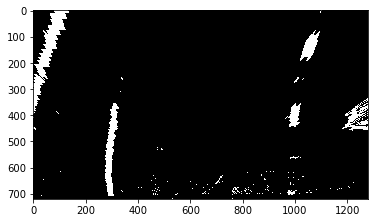

In [386]:
src_corners = [
    [600, 450],  # top left
    [700, 450],  # top right
    [1150, 719], # bottom right
    [255, 719]   # bottom left
]

binary_warped, Minv = PerspectiveTransformer.transform(combined_binary.astype(np.uint8), src_corners)
plt.imshow(binary_warped, cmap='gray')
plt.savefig('./output_images/warped.png', bbox_inches='tight')

## Apply a perspective transform to rectify binary image ("birds-eye view").

## Fit Polynomial

In [387]:
class LaneDetector:
    @staticmethod
    def find_lane_lines(binary_warped, visualize=False):
        """
        Find left and right lane lines in the provided binary warped image by initially
        using a histogram to find the lanes line in the bottom half of the image and then
        using a sliding window techniqe to iteratively move up and finf the next part of 
        the lane lines.
        Returns the points arrays to draw each of the left and right lanes as a 2nd order
        polynonial as well as the polynomial coefficients.
        
        :param binary_warped:
            Binary image that has already been warped (perspective transformed).
        
        :param visualize:
            Draw the sliding windows onto an output image.
        
        :returns:
            left_fitx - x values for plot of left lane
            right_fitx - x values for plot of right lane
            ploty - y values for plots of left and right lanes
            left_fit - 2nd order polynomial coefficients from np.polyfit for left lane
            right_fit - 2nd order polynomial coefficients from np.polyfit for right lane
        """
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        if visualize:
            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
            plt.imshow(out_img)
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)

        return left_fitx, right_fitx, ploty, left_fit, right_fit

    @staticmethod
    def get_curvature_radius(leftx, rightx, ploty, xm_per_pix=3.7/700, ym_per_pix=30/720):
        """Calculate radius of curvature from pixels of left and right lanes in a image.
        Args:
            leftx, rightx, ploty (arrays): points on the lane
            xm_per_pix (float): Conversion in x from pixels space to merters
            ym_per_pix (float): Conversion in y from pixels space to merters
        Returns (float):
            Average of radius of left and right lane curvature in meters
        """
        # Fit new polynomials to x,y in world space
        y_eval = np.max(ploty)
        left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radius of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
        return np.average([left_curverad, right_curverad])

    @staticmethod
    def show_inside_lane(undist_img, binary_warped, Minv, left_fitx, right_fitx, ploty):
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (undist_img.shape[1], undist_img.shape[0]))
        # Combine the result with the original image
        result = cv2.addWeighted(undist_img, 1, newwarp, 0.3, 0)  # image should be undistorted version
        return result

### Testing the Lane Detector

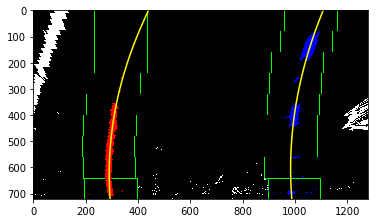

In [388]:
left_fitx, right_fitx, ploty, left_fit, right_fit = LaneDetector.find_lane_lines(binary_warped, visualize=True)
plt.savefig('./output_images/sliding_windows1.png', bbox_inches='tight')

## Measuring curvature

In [389]:
# show sample curvature
LaneDetector.get_curvature_radius(left_fitx, right_fitx, ploty)

507.0138343984039

## Visualize ditected lane

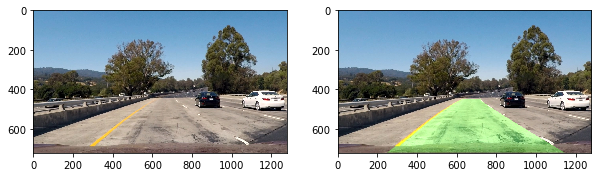

In [390]:
# show example
img = mpimg.imread('./test_images/test1.jpg')
filters = FinalThresholder.grad_color_threshold(img)
corners = [
    [600, 450],  # top left
    [700, 450],  # top right
    [1150, 719], # bottom right
    [255, 719]   # bottom left
]
combined_binary = np.zeros_like(filters)
combined_binary[(filters[:,:,1] == 1) | (filters[:,:,2] == 1)] = 1
binary_warped, Minv = PerspectiveTransformer.transform(combined_binary.astype(np.uint8), corners)
result = LaneDetector.show_inside_lane(img, binary_warped, Minv, left_fitx, right_fitx, ploty)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
ax1.imshow(img)
ax2.imshow(result)

# Final Pipeline

In [391]:
class Pipeline:
    @staticmethod
    def add_detected_lanes(img, mtx, dist, corners):
        # undistort image
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        # Apply gradient and color filters
        filters = FinalThresholder.grad_color_threshold(img)
        combined_binary = np.zeros_like(filters)
        combined_binary[(filters[:,:,1] == 1) | (filters[:,:,2] == 1)] = 1
        # Transform perspective
        binary_warped, Minv = PerspectiveTransformer.transform(combined_binary.astype(np.uint8), corners)
        # Find lanes
        left_fitx, right_fitx, ploty, _, _ = LaneDetector.find_lane_lines(binary_warped)
        # Draw predicted lane area
        result = LaneDetector.show_inside_lane(undist, binary_warped, Minv, left_fitx, right_fitx, ploty)
        # show curvature
        curve_rad = LaneDetector.get_curvature_radius(left_fitx, right_fitx, ploty)
        cv2.putText(result, 'Radius of curvature (m): {:.2f}'.format(curve_rad),
                    (20, 70), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
        return result

## Test Pipeline

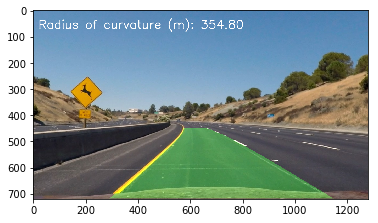

In [392]:
img = mpimg.imread('./test_images/test2.jpg')
corners = [
        [600, 450],  # top left
        [700, 450],  # top right
        [1150, 719], # bottom right
        [255, 719]   # bottom left
    ]
result = Pipeline.add_detected_lanes(img, mtx, dist, corners)
plt.imshow(result)
plt.savefig('./output_images/pipeline_result.png', bbox_inches='tight')

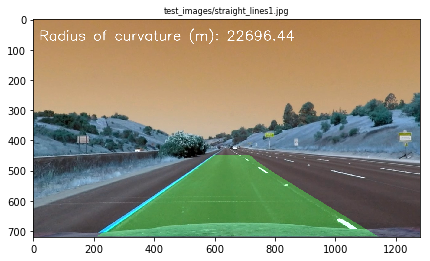

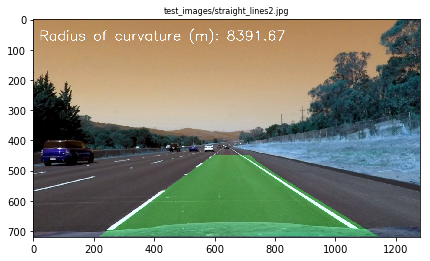

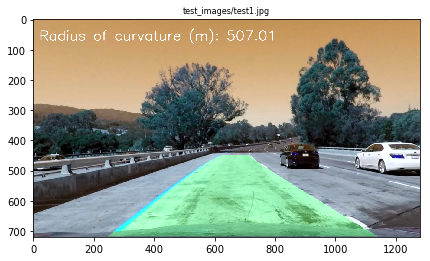

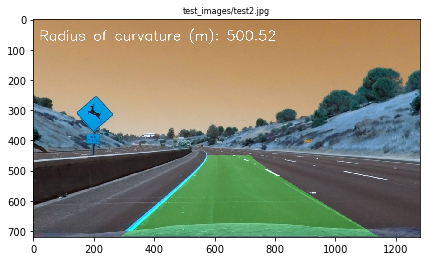

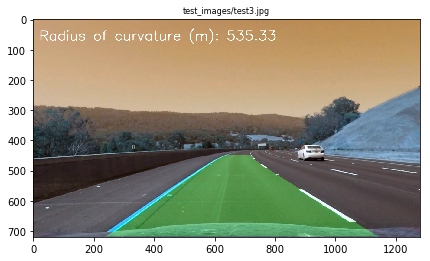

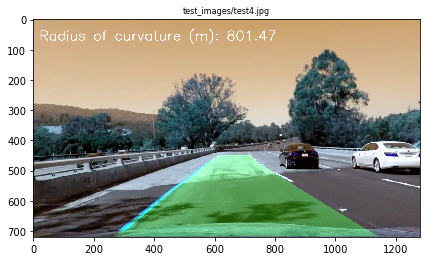

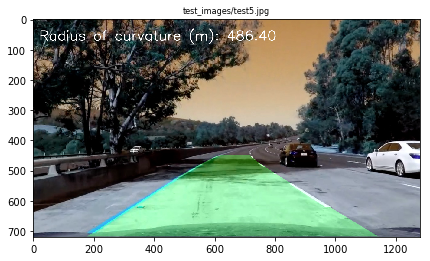

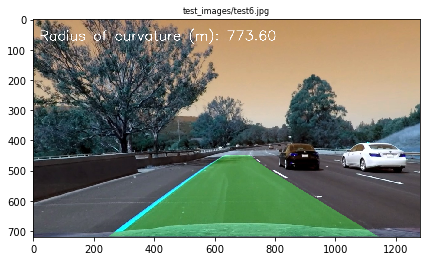

In [362]:
test_images = glob.glob('test_images/*.jpg')
output_folder = 'final_output_images'

for fname in test_images:
    img = cv2.imread(fname)
    fig, ax1 = plt.subplots(1, 1, figsize=(8,4))
    result = Pipeline.add_detected_lanes(img, mtx, dist, corners)
    
    ax1.imshow(result)
    ax1.set_title(fname, fontsize=8)
    
    out_fname = os.path.join(output_folder, "final_%s"%os.path.basename(fname))
    cv2.imwrite(out_fname, result)

plt.imshow(result)

## Apply to video

In [357]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [393]:
def transform_image(clip, mtx, dist, input_corners):
    """Helper function to apply lane detection with parameters."""
    def _transform(img):
        return Pipeline.add_detected_lanes(img, mtx, dist, input_corners)
    return clip.fl_image(_transform)

In [395]:
output_file = 'output_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")
#test_clip = clip1.fl_image(add_detected_lanes) #NOTE: this function expects color images!!
test_clip = clip1.fx(transform_image, mtx, dist, corners)
%time test_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4



 24%|██▍       | 303/1261 [01:07<03:51,  4.14it/s]


 48%|████▊     | 605/1261 [02:07<02:01,  5.39it/s]


 72%|███████▏  | 907/1261 [03:33<01:27,  4.05it/s]


 96%|█████████▌| 1205/1261 [04:42<00:10,  5.40it/s]


100%|█████████▉| 1260/1261 [04:52<00:00,  5.21it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

CPU times: user 4min 36s, sys: 1min 3s, total: 5min 39s
Wall time: 4min 54s


## Display Video

In [397]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file))

## Challenge Video

In [401]:
def challenge_video(input_video_fname, prefix_fname):
    output_file = prefix_fname+"_"+input_video_fname
    input_clip = VideoFileClip('./'+input_video_fname)
    #test_clip = clip1.fl_image(add_detected_lanes) #NOTE: this function expects color images!!
    test_clip = input_clip.fx(transform_image, mtx, dist, corners)
    %time test_clip.write_videofile(output_file, audio=False)

### Testing the challenge 1

In [400]:
input_video='challenge_video.mp4'
prefix="out"

challenge_video(input_video, prefix)

[MoviePy] >>>> Building video outchallenge_video.mp4
[MoviePy] Writing video outchallenge_video.mp4



 64%|██████▎   | 309/485 [01:05<00:33,  5.18it/s]


100%|██████████| 485/485 [01:44<00:00,  3.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: outchallenge_video.mp4 

CPU times: user 1min 41s, sys: 19.7 s, total: 2min 1s
Wall time: 1min 46s


### Testing the challenge 2

In [402]:
input_video='harder_challenge_video.mp4'
prefix="out"

challenge_video(input_video, prefix)

[MoviePy] >>>> Building video out_harder_challenge_video.mp4
[MoviePy] Writing video out_harder_challenge_video.mp4



 25%|██▌       | 303/1200 [01:16<04:40,  3.20it/s]


 50%|█████     | 605/1200 [02:30<01:58,  5.01it/s]


 76%|███████▌  | 907/1200 [03:40<00:56,  5.22it/s]


100%|█████████▉| 1199/1200 [04:39<00:00,  5.15it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_harder_challenge_video.mp4 

CPU times: user 4min 42s, sys: 1min, total: 5min 42s
Wall time: 4min 41s
